# Notebook for using sklearn packages and implementing Linear Models

In [2]:

import sys
sys.path.append("../scripts")
import linear_models

import numpy as np
import pandas as pd

import matplotlib.pyplot as plt
import plotly.graph_objects as go

from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler

from sklearn.linear_model import Ridge, Lasso, LinearRegression
from sklearn.pipeline import Pipeline
from mlxtend.feature_selection import SequentialFeatureSelector as SFS
from skopt import BayesSearchCV
from skopt.space import Real

pd.set_option('display.max_columns', None)
plt.style.use('seaborn')

In [3]:
def split_data(df, method):
    X = df.drop(['SRD'], axis=1)
    y = df['SRD']

    if method == "time-series":
        date = "2020-06-15 00:00"
        X_train = df[df["Time"] < date].drop(['SRD'], axis=1)
        X_test = df[df["Time"] > date].drop(['SRD'], axis=1)
        y_train = df[df["Time"] < date]["SRD"]
        y_test = df[df["Time"] > date]["SRD"]

    else:
        X_train, X_test, y_train, y_test = train_test_split(X, y, 
                                                            test_size=0.20, 
                                                            random_state=0,
                                                            shuffle=True)

    return X_train, X_test, y_train, y_test

def SFS_results(X_train, X_test, y_test, bs):
    best_variables = bs.best_estimator_.named_steps['sfs'].k_feature_names_
    total_variables = len(X_train.columns) - 1
    print(f"{len(best_variables)} out of {total_variables} variables were selected during SFS")
    print(f"Best variables: {best_variables}")
    print(f"Best hyperparameters: {bs.best_params_}")
    print("--------------------------------------------")
    print(f"Best RMSE on the left out data: {-bs.best_score_}")
    print("Best RMSE on test:", -bs.score(X_test.drop("Time", axis=1), y_test))

    # Get the RMSE scores across each SFS combination
    avg_scores = []
    for subset_size, subset_info in bs.best_estimator_.named_steps['sfs'].subsets_.items():
        avg_scores.append(np.sqrt(-subset_info["avg_score"]))
        
    plt.figure(figsize=(5, 3), dpi=200)
    plt.plot([i for i in range(1, len(avg_scores)+1)], avg_scores, marker='o')
    plt.xlabel('Number of Variables')
    plt.ylabel('RMSE')
    plt.xticks([i for i in range(1, len(avg_scores)+1)])
    #plt.title('RMSE scores across each Sequential (Forward) Feature Selection variable combination')
    plt.show()
  
def BayesSearchCV_results(X_test, y_test, bs):
    print(f"Best hyperparameters: {bs.best_params_}")
    print("--------------------------------------------")
    print(f"Best RMSE on the left out data: {-bs.best_score_}")
    print("Best RMSE on test:", -bs.score(X_test.drop("Time", axis=1), y_test))  
   
def plot_training_test(X_train, y_train, X_test, y_test):
    fig = go.Figure()

    fig.add_trace(
        go.Scatter(
            x=X_train["Time"], 
            y=y_train.squeeze(), 
            mode='markers', 
            marker=dict(size=4),
            name='Train',
        )
    )

    fig.add_trace(
        go.Scatter(
            x=X_test["Time"], 
            y=y_test.squeeze(), 
            mode='markers', 
            marker=dict(size=4),
            name='Test',
        )
    )

    fig.update_layout(title="Train and Test Data", 
                    legend=dict(
                            orientation="h",
                            yanchor="bottom",
                            y=1.02,
                            xanchor="right",
                            x=0.15
                        ),
                    xaxis_title="Time", 
                    yaxis_title="SRD")

    fig.show()

def plot_parity_residual(X_test, bs, rng=[2, 6.5]):
    y_pred = bs.predict(X_test.drop("Time", axis=1))
    fig, axs = plt.subplots(2, 2, figsize=(8, 8), dpi=200)

    # Scatter plot
    axs[0, 0].scatter(y_test, y_pred)
    axs[0, 0].plot([0, 34], [0, 34], color='red')
    axs[0, 0].set_xlabel("True values")
    axs[0, 0].set_ylabel("Predicted values")
    axs[0, 0].set_title("Parity plot")

    # Residuals plot
    residuals = y_test - y_pred
    axs[0, 1].scatter(y_pred, residuals)
    axs[0, 1].axhline(y=0, color='red', linestyle='--')
    axs[0, 1].set_xlabel("Predicted values")
    axs[0, 1].set_ylabel("Residuals")
    axs[0, 1].set_title("Residuals plot")

    lower_percentile = np.percentile(y_test, 0.5)
    upper_percentile = np.percentile(y_test, 99.5)
    mask = (y_test > lower_percentile) & (y_test < upper_percentile)

    y_test_0_5 = y_test[mask.values].squeeze()
    y_pred_0_5 = y_pred[mask.values]

    # Scatter plot
    axs[1, 0].scatter(y_test_0_5, y_pred_0_5)
    axs[1, 0].plot(rng, rng, color='red')
    axs[1, 0].set_xlim(rng)
    axs[1, 0].set_ylim(rng)
    axs[1, 0].set_xlabel("True values")
    axs[1, 0].set_ylabel("Predicted values")
    axs[1, 0].set_title("Exluding 0.5th and 99.5th percentiles")

    # Residuals plot
    residuals = y_test_0_5 - y_pred_0_5
    axs[1, 1].scatter(y_pred_0_5, residuals)
    axs[1, 1].axhline(y=0, color='red', linestyle='--')
    axs[1, 1].set_xlabel("Predicted values")
    axs[1, 1].set_ylabel("Residuals")
    axs[1, 1].set_title("Exluding 0.5th and 99.5th percentiles")

    plt.tight_layout()
    plt.show()

def plot_prediction(df, X_train, X_test, bs):
    fig = go.Figure()

    fig.add_trace(
        go.Scatter(
            x=df["Time"], 
            y=df["SRD"], 
            mode='markers', 
            marker=dict(size=4),
            name='Actual',
        )
    )

    fig.add_trace(
        go.Scatter(
            x=X_train["Time"], 
            y=bs.predict(X_train.drop("Time", axis=1)), 
            mode='markers', 
            marker=dict(size=4),
            name='Training',
        )
    )

    fig.add_trace(
        go.Scatter(
            x=X_test["Time"], 
            y=bs.predict(X_test.drop("Time", axis=1)), 
            mode='markers', 
            marker=dict(size=4),
            name='Testing',
        )
    )

    fig.update_layout(title="Modelling the SRD using linear regression", 
                    legend=dict(
                            orientation="h",
                            yanchor="bottom",
                            y=1.02,
                            xanchor="right",
                            x=0.3
                        ),
                    xaxis_title="Time", 
                    yaxis_title="Specific Reboiler Duty [MJ/kgCO2]")

    fig.show()
    
def plot_coefficients(bs, named_step):
    if 'ols' in named_step:
        feature_names = bs.best_estimator_.named_steps['sfs'].k_feature_names_
    else:
        feature_names = bs.best_estimator_.named_steps[named_step].feature_names_in_
    
    feature_coef = bs.best_estimator_.named_steps[named_step].coef_
    
    df = pd.DataFrame({'Feature': feature_names,
                       'Coefficient': feature_coef})

    fig = go.Figure(data=[go.Bar(x=df['Feature'], y=df['Coefficient'])])  
    
    fig.update_layout(
    xaxis_title="Feature",
    yaxis_title="Coefficient",
    height=400,
    width=800,
    legend=dict(
                orientation="h",
                yanchor="bottom",
                y=1.02,
                xanchor="right",
                x=0.15
            ),
    template="seaborn",
    margin=dict(l=0, r=20, t=20, b=10),
    )
    
    fig.show()

## Splitting and scaling

In [4]:
df = pd.read_pickle("../data/processed/SRD_Lysekil.pkl")

X_train, X_test, y_train, y_test = split_data(df, method="none")#, "time-series")
plot_training_test(X_train, y_train, X_test, y_test)

scaler = StandardScaler()
cols = [col for col in X_train.columns if col != 'Time']
X_train[cols] = scaler.fit_transform(X_train[cols])
X_test[cols] = scaler.transform(X_test[cols])
print(f"The testing set is {100*y_test.shape[0]/df.shape[0]:.1f}% of the original dataset")

The testing set is 20.0% of the original dataset


## Ordinary Linear Regression

10 out of 14 variables were selected during SFS
Best variables: ('D1', 'T1', 'P2', 'T2', 'T5', 'P6', 'T7', 'F8', 'T9', 'T10')
Best hyperparameters: OrderedDict([('sfs__floating', True), ('sfs__forward', True)])
--------------------------------------------
Best RMSE on the left out data: 0.6906349420547485
Best RMSE on test: 0.6393921971321106


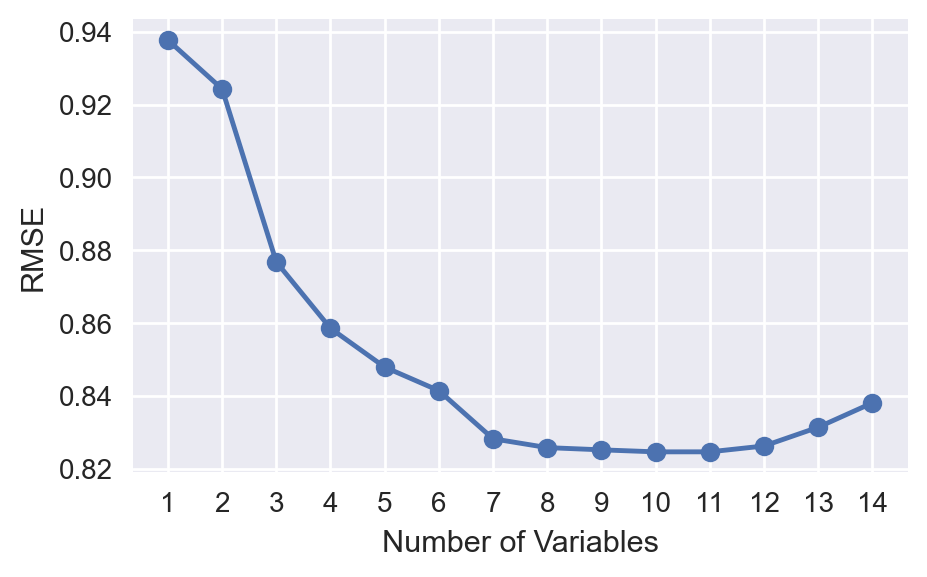

In [5]:
ols1 = LinearRegression()
ols2 = LinearRegression()

sfs = SFS(ols1, 
          k_features='best', 
          forward=False, 
          scoring='neg_mean_squared_error', 
          cv=5, 
          n_jobs=-1)

pipe = Pipeline([('sfs', sfs), 
                 ('ols2', ols2)])

bs = BayesSearchCV(pipe,
                   {
                        'sfs__forward': [True, False],
                        'sfs__floating': [True, False],
                   }, 
                   n_iter=1,
                   cv=5, 
                   scoring='neg_root_mean_squared_error',
                   random_state=0)

bs = bs.fit(X_train.drop("Time", axis=1), y_train)
SFS_results(X_train, X_test, y_test, bs, )

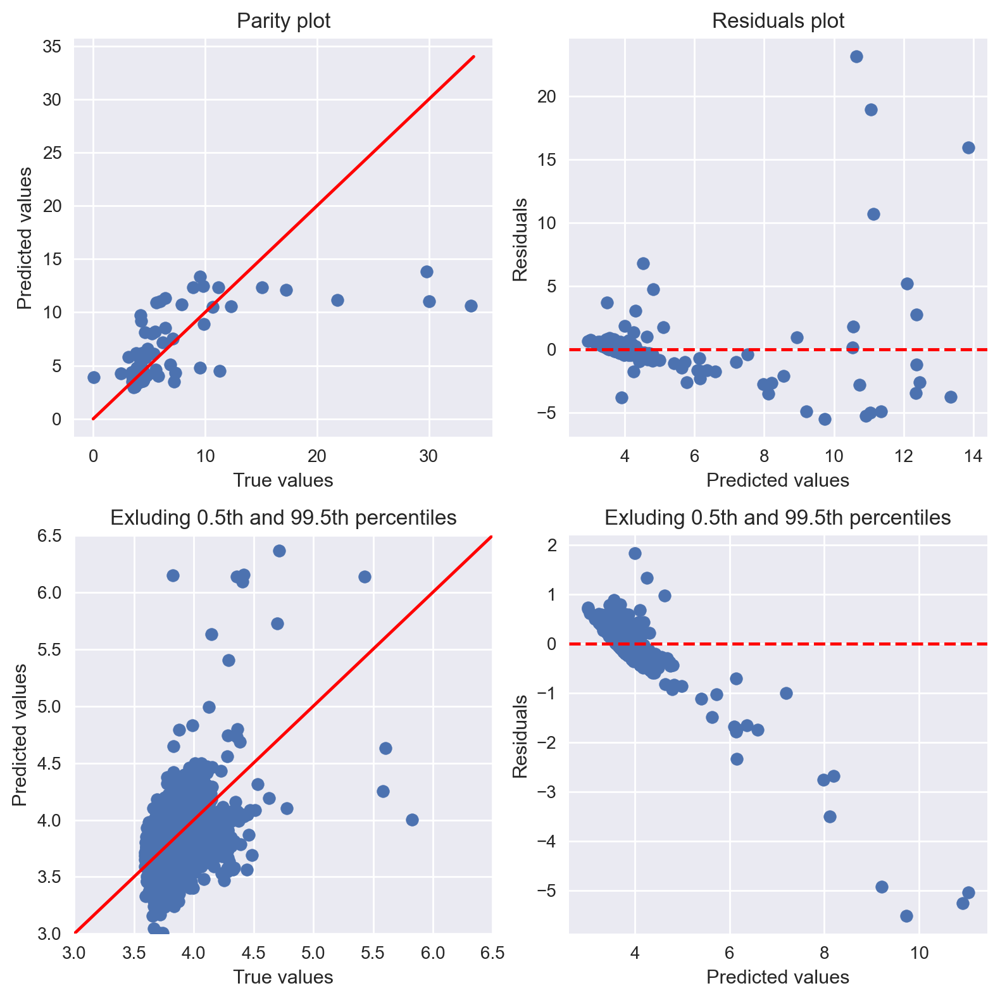

In [6]:
plot_coefficients(bs, 'ols2')
plot_parity_residual(X_test, bs, [3, 6.5])
plot_prediction(df, X_train, X_test, bs)

## Ridge Regression

In [7]:
ridge1 = Ridge()
ridge2 = Ridge()

pipe_ridge = Pipeline([('ridge2', ridge2)])
bs_ridge = BayesSearchCV(pipe_ridge,
                   {
                        'ridge2__alpha': Real(1e-6, 1e+6, prior='log-uniform'),
                   }, 
                   n_iter=5,
                   cv=5, 
                   scoring='neg_root_mean_squared_error',
                   random_state=0)

bs_ridge = bs_ridge.fit(X_train.drop("Time", axis=1), y_train)
BayesSearchCV_results(X_test, y_test, bs_ridge)

Best hyperparameters: OrderedDict([('ridge2__alpha', 2.352718564818733)])
--------------------------------------------
Best RMSE on the left out data: 0.6960870146751403
Best RMSE on test: 0.6564533710479736


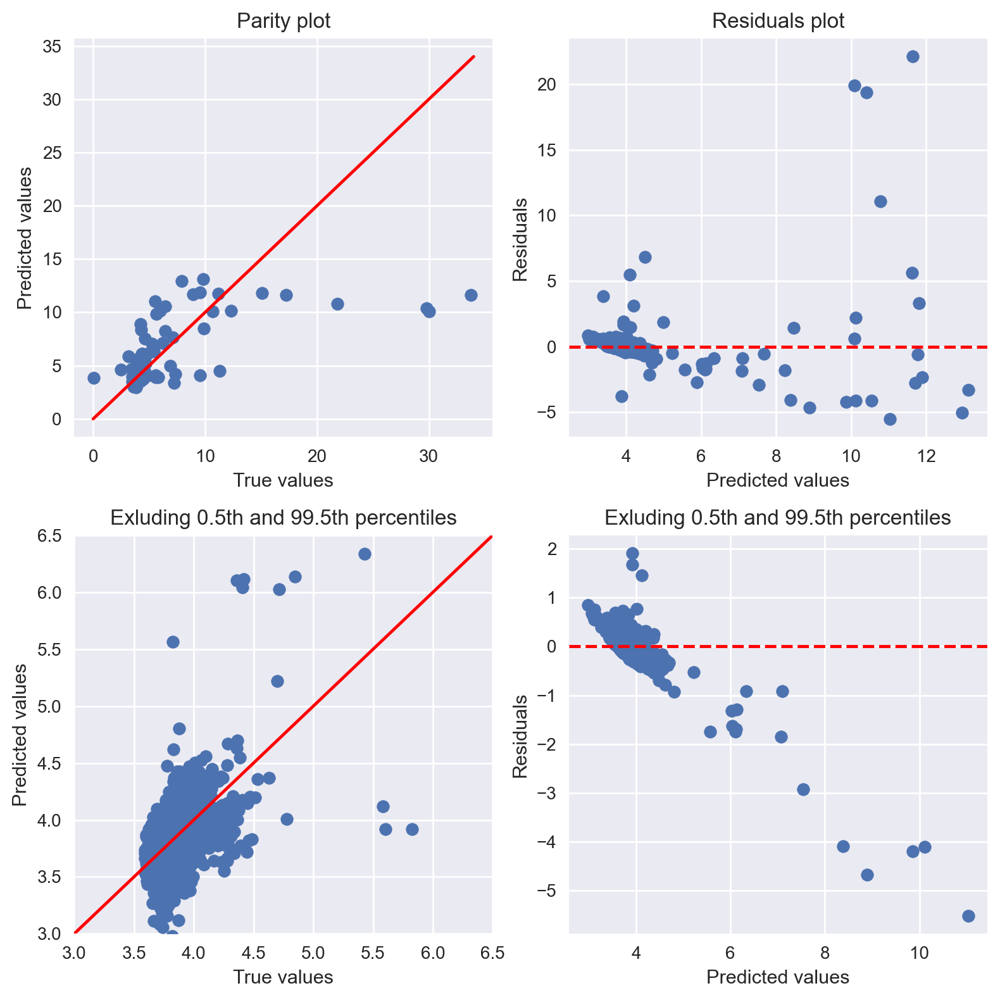

In [8]:
plot_coefficients(bs_ridge, 'ridge2')
plot_parity_residual(X_test, bs_ridge, [3, 6.5])
plot_prediction(df, X_train, X_test, bs_ridge)

## Lasso Regression

In [9]:
lasso1 = Lasso()
lasso2 = Lasso()

pipe_lasso = Pipeline([('lasso2', lasso2)])
bs_lasso = BayesSearchCV(pipe_lasso,
                   {
                        'lasso2__alpha': Real(1e-6, 1, prior='log-uniform'),
                   }, 
                   n_iter=5,
                   cv=5, 
                   scoring='neg_root_mean_squared_error',
                   random_state=0)

bs_lasso = bs_lasso.fit(X_train.drop("Time", axis=1), y_train)
BayesSearchCV_results(X_test, y_test, bs_lasso)

Best hyperparameters: OrderedDict([('lasso2__alpha', 0.0015338574134575655)])
--------------------------------------------
Best RMSE on the left out data: 0.6943198442459106
Best RMSE on test: 0.6553624868392944


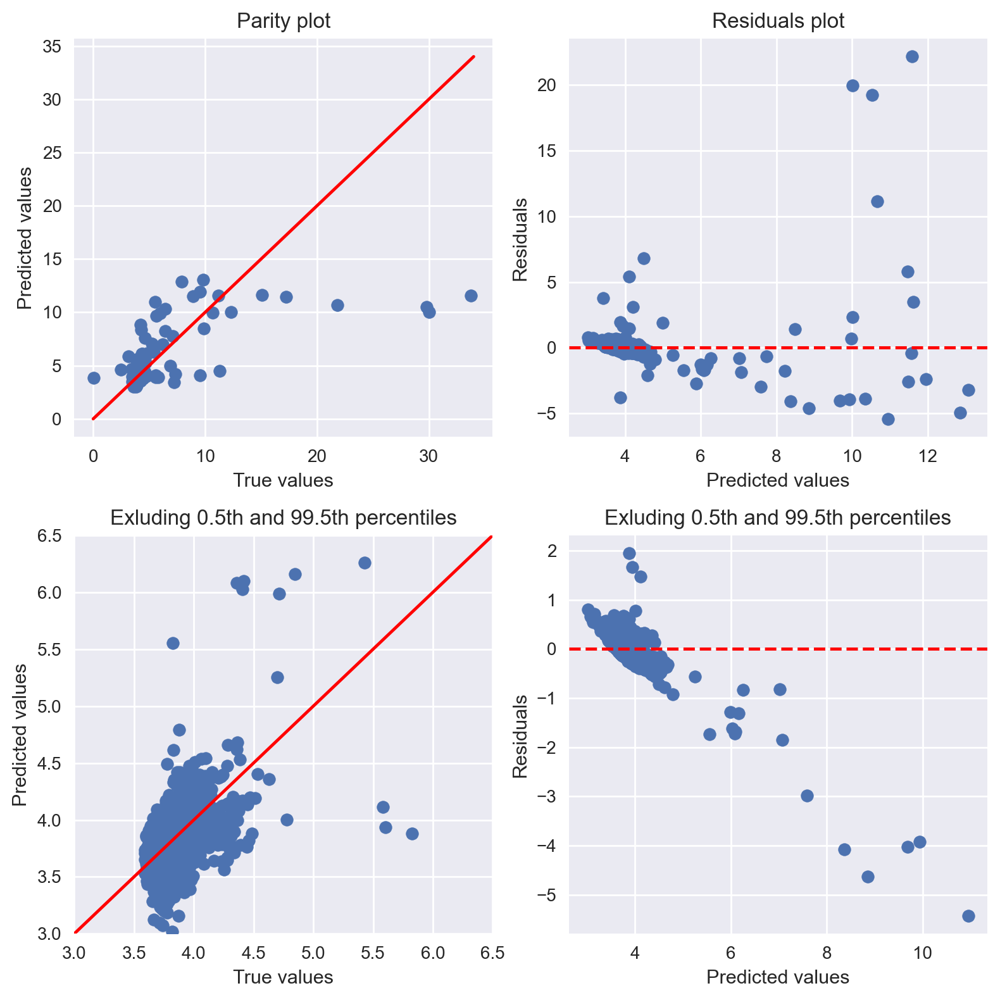

In [10]:
plot_coefficients(bs_lasso, 'lasso2')
plot_parity_residual(X_test, bs_lasso, [3, 6.5])
plot_prediction(df, X_train, X_test, bs_lasso)

## Partial Least Squares Regression

In [13]:
from sklearn.cross_decomposition import PLSRegression

plsr1 = PLSRegression()
plsr2 = PLSRegression()

pipe_plsr = Pipeline([('plsr2', plsr2)])
bs_plsr = BayesSearchCV(pipe_plsr,
                   {
                        'plsr2__n_components': [1, 2, 3],
                   }, 
                   n_iter=5,
                   cv=5, 
                   scoring='neg_root_mean_squared_error',
                   random_state=0)

bs_plsr = bs_plsr.fit(X_train.drop("Time", axis=1), y_train)
BayesSearchCV_results(X_test, y_test, bs_plsr)

Best hyperparameters: OrderedDict([('plsr2__n_components', 2)])
--------------------------------------------
Best RMSE on the left out data: 0.7439010852400246
Best RMSE on test: 0.7364239502874587


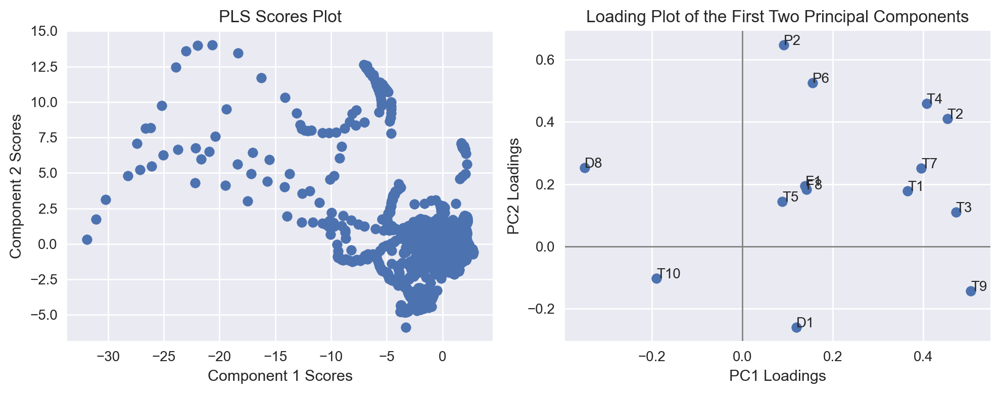

In [38]:
x_scores = bs_plsr.best_estimator_.named_steps['plsr2'].x_scores_
x_loadings = bs_plsr.best_estimator_.named_steps['plsr2'].x_loadings_
n = x_loadings.shape[0]
variable_names = X_train.columns.values[1:]

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(10, 4), dpi=200)

ax1.scatter(x_scores[:, 0], x_scores[:, 1])
ax1.set_title('PLS Scores Plot')
ax1.set_xlabel('Component 1 Scores')
ax1.set_ylabel('Component 2 Scores')

ax2.scatter(x_loadings[:, 0], x_loadings[:, 1])
for i, txt in enumerate(variable_names):
    ax2.annotate(txt, (x_loadings[i, 0], x_loadings[i, 1]))

ax2.axhline(0, color='grey', lw=1)
ax2.axvline(0, color='grey', lw=1)
ax2.set_xlabel('PC1 Loadings')
ax2.set_ylabel('PC2 Loadings')
ax2.set_title('Loading Plot of the First Two Principal Components')

plt.tight_layout()
plt.show()

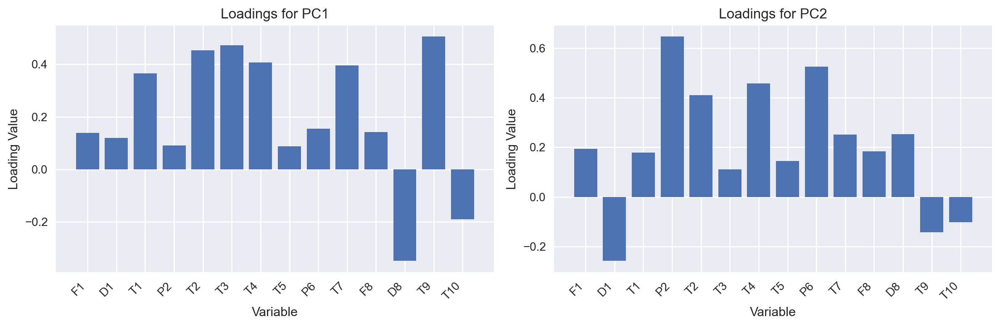

In [41]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.cross_decomposition import PLSRegression

n_features = len(variable_names)
n_components = 2
loadings = x_loadings

# Create subplots for the loadings of each component
fig, axes = plt.subplots(1, n_components, figsize=(12, 4), dpi=200)

for i in range(n_components):
    axes[i].bar(range(n_features), loadings[:, i])
    axes[i].set_title(f'Loadings for PC{i+1}')
    axes[i].set_xlabel('Variable')
    axes[i].set_ylabel('Loading Value')
    axes[i].set_xticks(range(n_features))
    axes[i].set_xticklabels(variable_names, rotation=45, ha="right")

plt.tight_layout()
plt.show()
